In [9]:
output_notebook()
import os

import numpy as np # we will use this later, so import it now

from bokeh.io import output_notebook, show
from bokeh.plotting import figure

Loading BokehJS ...

In [6]:
os.chdir('/Users/minority/Code/Git/cardio')

In [7]:
ls

LICENSE                     references/
Makefile                    reports/
README.md                   requirements.txt
__pycache__/                requirements_conda.txt
data/                       requirements_pip.txt
docs/                       setup.py
environment.yml             src/
history.md                  src.egg-info/
logs/                       test_environment.py
models/                     tests.json
notebooks/                  tox.ini
patient_006_full__dcm.json  venv/


In [8]:
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.plotting import figure
from bokeh.sampledata.autompg import autompg_clean as df
from bokeh.transform import factor_cmap

df.cyl = df.cyl.astype(str)
df.yr = df.yr.astype(str)

group = df.groupby(by=['cyl', 'mfr'])
source = ColumnDataSource(group)

p = figure(plot_width=800, plot_height=300, title="Mean MPG by # Cylinders and Manufacturer",
           x_range=group, toolbar_location=None, tools="")

p.xgrid.grid_line_color = None
p.xaxis.axis_label = "Manufacturer grouped by # Cylinders"
p.xaxis.major_label_orientation = 1.2

index_cmap = factor_cmap('cyl_mfr', palette=['#2b83ba', '#abdda4', '#ffffbf', '#fdae61', '#d7191c'], 
                         factors=sorted(df.cyl.unique()), end=1)

p.vbar(x='cyl_mfr', top='mpg_mean', width=1, source=source,
       line_color="white", fill_color=index_cmap, 
       hover_line_color="darkgrey", hover_fill_color=index_cmap)

p.add_tools(HoverTool(tooltips=[("MPG", "@mpg_mean"), ("Cyl, Mfr", "@cyl_mfr")]))

show(p)

In [10]:
import SimpleITK as sitk

In [13]:
sitk_img = sitk.ReadImage('data/processed/nrrd_export/0003-04NEJQUZ-2007-03-13_volume_segment.nrrd')

In [14]:
nda = sitk.GetArrayFromImage(sitk_img)

In [15]:
nda.shape

(25, 16, 256, 256)

In [18]:
import matplotlib.pyplot as plt
%matplotlib inline

In [17]:
nda3d = nda[0]
nda2d = nda3d[0]

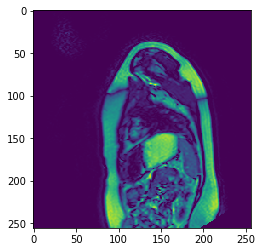

In [19]:
plt.imshow(nda2d)

In [36]:
p = figure(x_range=(0, 256), y_range=(0, 256))
images = [img for img in nda3d]
# must give a vector of image data for image parameter
p.image(image=images, x=0, y=0, dw=256, dh=256)

show(p)

In [38]:
from bokeh.io import gridplot, output_file, show
# put all the plots in a grid layout
g = gridplot([[p, p], [None, p]])

# show the results
show(g)

ImportError: cannot import name 'gridplot'